# Find rain days in a specified region, given 8 upper atm variables and respective Gridmet data.

This notebook calculates average rain on a 128x128 grid, it then averages the respective 8 upper atm variables. 

* this version loads netcdf files directly via xarray
* "Gridmet data" can now be replaced with any model's output

### TODO items

* better graphs (i.e. include lat/lon scale)



In [1]:
from IPython import display
import numpy as np

#from skimage.metrics import structural_similarity as ssim
import copy


In [2]:
# load netcdf files directly via xarray
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy

# Configuration

In [4]:
# Ordering: nRow ordering: obs, raw, regcm4, wrf, mpas, CNN, sdsm, kddm, MBCn, LOCA
mpi_sigfiles=['/glade/work/mcginnis/DCA/data/gen/final/regcm4/hist/prec.hist.MPI-ESM-LR.RegCM4.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/regcm4/rcp85/prec.rcp85.MPI-ESM-LR.RegCM4.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/wrf/hist/prec.hist.MPI-ESM-LR.WRF.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/wrf/rcp85/prec.rcp85.MPI-ESM-LR.WRF.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpas/hist/prec.hist.MPI-ESM-LR.MPAS.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpas/rcp85/prec.rcp85.MPI-ESM-LR.MPAS.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/cnn/hist/prec.hist.MPI-ESM-LR.CNN.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/cnn/rcp85/prec.rcp85.MPI-ESM-LR.CNN.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
#'/glade/work/mcginnis/DCA/data/gen/sdsm/hist/prec.hist.MPI-ESM-LR.SDSM.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
#'/glade/work/mcginnis/DCA/data/gen/sdsm/hist/prec.hist.MPI-ESM-LR.SDSM.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/kddm/hist/prec.hist.MPI-ESM-LR.KDDM.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/kddm/rcp85/prec.rcp85.MPI-ESM-LR.KDDM.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mbcn/hist/prec.hist.MPI-ESM-LR.MBCn.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mbcn/rcp85/prec.rcp85.MPI-ESM-LR.MBCn.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/loca/hist/prec.hist.MPI-ESM-LR.LOCA.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/loca/rcp85/prec.rcp85.MPI-ESM-LR.LOCA.day.2075-2100.NAM-22i.SGP.x098.y36.nc']

# Compact Configuration

In [5]:
sigdir = '/glade/work/mcginnis/DCA/data/gen/final'

### Load model output data

In [6]:
##################
## LOAD GRIDMET ##
##################
# 1980-1989
istart = 365
#ndays = 3653  # 1980-1989
ndays = 13515 # 1980-2016 

dv1 = xr.open_dataset('/glade/work/dkorytin/srgan_data/prec128_gridmetA_1979-2016.nc')['prec'][istart:istart+ndays]
# dv2 = xr.open_dataset('/glade/work/dkorytin/srgan_data/tmax128_gridmetA_1979-2016.nc')['tmax'][istart:istart+ndays]
# dv3 = xr.open_dataset('/glade/work/dkorytin/srgan_data/tmin128_gridmetA_1979-2016.nc')['tmin'][istart:istart+ndays]
# dv4 = xr.open_dataset('/glade/work/dkorytin/srgan_data/uas128_gridmetA_1979-2016.nc')['uas'][istart:istart+ndays]
# dv5 = xr.open_dataset('/glade/work/dkorytin/srgan_data/vas128_gridmetA_1979-2016.nc')['vas'][istart:istart+ndays]
# dv6 = xr.open_dataset('/glade/work/dkorytin/srgan_data/huss128_gridmetA_1979-2016.nc')['huss'][istart:istart+ndays]
# dv7 = xr.open_dataset('/glade/work/dkorytin/srgan_data/rsds128_gridmetA_1979-2016.nc')['rsds'][istart:istart+ndays]
# dv8 = xr.open_dataset('/glade/work/dkorytin/srgan_data/miss128_gridmetB_1979-2016.nc')['miss'][istart:istart+ndays]




### Load MPI UATM data

In [7]:
###################
## LOAD MPI      ##
###################  
def load_uatm_mpi_hist():
    global mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mnvars
    
    mnvars = 8
    
    d='/glade/p/cisl/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'

    mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv2 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv3 = xr.open_dataset(d+'Q_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['Q'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv4 = xr.open_dataset(d+'T_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['T'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv5 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv6 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p500_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv7 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv8 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))

def load_uatm_mpi_future():
    global mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mnvars
    
    d='/glade/p/cisl/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/rcp85/'

    mnvars = 8
    mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['U'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv2 = xr.open_dataset(d+'V_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['V'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv3 = xr.open_dataset(d+'Q_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['Q'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv4 = xr.open_dataset(d+'T_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p700_20060101-21001231_dayavg_mpigrid.nc')['T'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv5 = xr.open_dataset(d+'Z_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p700_20060101-21001231_dayavg_mpigrid.nc')['Z'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv6 = xr.open_dataset(d+'Z_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p500_20060101-21001231_dayavg_mpigrid.nc')['Z'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv7 = xr.open_dataset(d+'U_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p250_20060101-21001231_dayavg_mpigrid.nc')['U'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv8 = xr.open_dataset(d+'V_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p250_20060101-21001231_dayavg_mpigrid.nc')['V'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))

#load_uatm_mpi_future()


# Averaging code

In [8]:
###################
## UATM averages ##
###################

def calc_uatm_average(mpr_min, mpr_max, rainsignal, ymin, ymax):
    # global inputs: dv[1-8], mdv[1-8], mnvars
    mnvars = 8
    
    # initialize accumulators
    indices = []
    distribution = []
    raw_ires = len(mdv1[0])
    raininput = np.zeros((mnvars, raw_ires, raw_ires))
    raincount = 0
    
    for ii in range(0,len(rainsignal)):
        mpr = rainsignal[ii]
            
        # May = 5
        if mpr["time.month"] == 5 and mpr["time.year"] >= ymin and mpr["time.year"] < ymax:    



            if mpr >= mpr_min and mpr < mpr_max:
                distribution.append(mpr)
                indices.append(ii)

                #mpr = dv1[ii].sel(lat=slice(32.125,38.125), lon=slice(-101.875,-93.875)).mean()

                # find matching input sample 
                #ot= dv1[ii-1]['time']
                ot = str(np.array(mpr['time']))

                mdv1.sel(time=ot,method='nearest')
                isample = [mdv1.sel(time=ot,method='nearest'),mdv2.sel(time=ot,method='nearest'),mdv3.sel(time=ot,method='nearest'),mdv4.sel(time=ot,method='nearest'),mdv5.sel(time=ot,method='nearest'),mdv6.sel(time=ot,method='nearest'),mdv7.sel(time=ot,method='nearest'),mdv8.sel(time=ot,method='nearest')]
                #ot= dv1[ii]['time']
                #assert ot["time.day"]==isample[0]['time.day'], "Days are not equal"
                isample = np.array(isample)

                raininput += isample
                raincount += 1
            
    raininput /= raincount
    #print("days:", raincount)
    
    return raininput, raincount, distribution, indices
    

# Plot routines

In [94]:
# POSTAGE STAMP LAYOUT
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import cartopy.feature as cfeature

from os.path import basename
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.ticker as ticker
from matplotlib import ticker

import warnings
warnings.filterwarnings("ignore")

   


def plot_models_group_drymoistwet(sigfiles, vmin, vmax, mpr_min, mpr_max, title):     
    varmames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']

    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))
    
    # Q850 cubehelix_r, 0:maximum
    vmin[2] = 0
    
    # U250 brg, 0:max
    vmin[6] = 0
    
    # V250 PuOr, symmetric around zero
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))

    
    #fig, axarr = plt.subplots(nrows=3, ncols=8, figsize = (10,10*(3/8.+0.0)), gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1,1,1.3]})
    fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=8, figsize = (20,20*(len(sigfiles)/8.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    lon = mdv1[0].lon
    lat = mdv1[0].lat

    
    # plots 
    #for sigfile in sigfiles:
    #for jj, mpr_min, mpr_max, label in [[0, 0., 0.254, 'Dry'], [1, 0.254, 3., 'Moist'], [2, 3., 9999., 'Wet']]:
    #mpr_min, mpr_max = [0., 0.254]
    for jj in range(len(sigfiles)):

        # get jjth sigfile
        sigfile = sigfiles[jj]
        
        # row label
        sigfilename = basename(sigfile)
        #print ("days:", count, ", model:", sigfilename)
        label = ' '.join(sigfilename.split('.')[3:4])


        
        # load UATM and signal file
        if sigfile.lower().find('hist') >= 0: 
            load_uatm_mpi_hist()
        elif sigfile.lower().find('rcp85') >= 0: 
            load_uatm_mpi_future()
        else:
            print ("ERROR: neither hist or rcp85 found")
        rainsignal = xr.open_dataset(sigfile)['prec']

        # plot
        counts = [0]*len(sigfiles)
                
        # calc avg atm for criteria
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
        counts[jj] = count

        for ii in range(8):
            axarr[jj,ii].coastlines()
            axarr[jj,ii].add_feature(cfeature.STATES)
            img_extent = (lon.min(), lon.max(), lat.min(), lat.max())

            #plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
            plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  

            # show y tics on first column
            if ii==0:
                axarr[jj,ii].get_yaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize='xx-small')

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                # lat range: 56 to 23
                labels = [item.get_text() for item in axarr[jj,ii].get_yticklabels()]
                #labels = ['56','46','36','26']
                axarr[jj,ii].set_yticklabels(labels)

            ## show y labels on last column
            #if ii==7:
                ##axarr[jj,ii].get_yaxis().set_visible(True)
                ##axarr[jj,ii].tick_params(labelsize='xx-small')
                #
                #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.03, pad=0.2)
                #
                #
                ##ax.set_ylabel("Label", rotation=270)
                #
                ##cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="vertical", fraction=0.046, pad=0.016)
                #cbar.set_label('dry', rotation=90, size='xx-small')
                #cbar.ax.tick_params(labelsize='xx-small')





            if ii>=1:
                axarr[jj,ii].get_yaxis().set_visible(False)
                axarr[jj,ii].tick_params(labelsize='xx-small')



            if jj == 0:
                axarr[jj,ii].set_title(varmames[ii])
                axarr[jj,ii].get_xaxis().set_visible(False)
                axarr[jj,ii].tick_params(labelsize='xx-small')

            if jj==1:
                axarr[jj,ii].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

            # show custom tics on bottom row: lon=slice(-113,-80)
            if jj==len(sigfiles)-1:
                axarr[jj,ii].get_xaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize='xx-small')

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                labels = [item.get_text() for item in axarr[jj,ii].get_xticklabels()]
                #labels[1] = '-113'
                #labels[2] = '-103'
                #labels[3] = '-93'
                ##labels[4] = '-83'
                axarr[jj,ii].set_xticklabels(labels)




            # colorbar only on 3rd postage stamp
            if jj==len(sigfiles)-1:
                # use scientific notation on 3rd column colorbar only
                if ii == 2:     
                    def fmt(x, pos):
                        a, b = '{:.1e}'.format(x).split('e')
                        b = int(b)
                        return r'${}e{}$'.format(a, b)
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))
                    #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format='%.0e') #format=ticker.FuncFormatter(fmt))
                    #cbar.set_ticks([0.2, 0.4, 0.6, 0.8])
                    #cbar.set_ticklabels(["A", "B", "C", "D"])
                    tick_locator = ticker.MaxNLocator(nbins=4)
                    cbar.locator = tick_locator
                    cbar.update_ticks()
                else:
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=None)                    

                cbar.set_label(units[ii], size='xx-small')
                cbar.ax.tick_params(labelsize='xx-small')
                    
            # row titles
            nrows = len(sigfiles)
            plt.figtext(0.09, 1-(1.4/nrows)-jj*(.73/nrows), label+': '+str(counts[jj]), fontsize=11, rotation=90)


        

#         # row title
#         sigfilename = basename(sigfile)
#         #print ("days:", count, ", model:", sigfilename)
#         rowtitle = ' '.join(sigfilename.split('.')[0:4]) # + ' Count: '+str(counts)

        # title
        #fig.suptitle(title, y=1.05, fontsize=14)
        fig.suptitle(title, y=1-(.5/nrows), fontsize=14, fontweight="bold")
        
        #plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0.0, hspace=0, right=0.7)

    plt.show()
        


### Climate average

In [10]:
sigfile = mpi_sigfiles[0]    
rainsignal = xr.open_dataset(sigfile)['prec']


In [11]:
# calc average dry, moist, wet
load_uatm_mpi_hist()
dryinput, drycount, drydistribution, dryindices = calc_uatm_average(0, 0.254, rainsignal, -9999, 9999) 
moistinput, moistcount, moistdistribution, moistindices = calc_uatm_average(0.254, 3.0, rainsignal, -9999, 9999) 
wetinput, wetcount, wetdistribution, wetindices = calc_uatm_average(3.0, 9999.0, rainsignal, -9999, 9999) 


# Run over all models

In [13]:
sigfiles = mpi_sigfiles # see configuration cell at beginning of notebook

### Hist

In [15]:
# find max/min for each variable accross ALL hist files
sigfiles_hist = list(filter(lambda line:'hist' in line, mpi_sigfiles))

# find min/max values for entire sigfiles set
vmin = 9999*np.ones(8) 
vmax = -9999*np.ones(8) 
for sigfile in sigfiles_hist:        
    if sigfile.lower().find('hist') >= 0: 
        load_uatm_mpi_hist()
    elif sigfile.lower().find('rcp85') >= 0: 
        load_uatm_mpi_future()
    else:
        print ("ERROR: neither hist or rcp85 found")
    rainsignal = xr.open_dataset(sigfile)['prec']
    
    for mpr_min, mpr_max in [(0,0.254), (0.254, 3.0), (3.0, 9999.0)]:
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
        #avginput -= allinput # climate
        vmin = [min(avginput[ii].min(),vmin[ii]) for ii in range(8)]
        vmax = [max(avginput[ii].max(),vmax[ii]) for ii in range(8)]


In [184]:
# vmin = [-5.93, -6.47, 0.0024, 263.73, 2935.47, 5466.98, -1.46, -16.57]
# vmax = [7.69, 9.23, 0.012, 283.36, 3184.33, 5870.52, 31.59, 17.67]


In [185]:
print(vmin)
print(vmax)

[-5.929319741069406, -6.469663463352959, 0.0024263855265814183, 263.72557722960465, 2935.4722788636113, 5466.978391835387, -1.4625156026490977, -16.566786752620214]
[7.689785964052442, 9.227594636615954, 0.011953578519751318, 283.3643630178351, 3184.3255644719957, 5870.522003321256, 31.59044571997414, 17.667204336267737]


DRY HIST


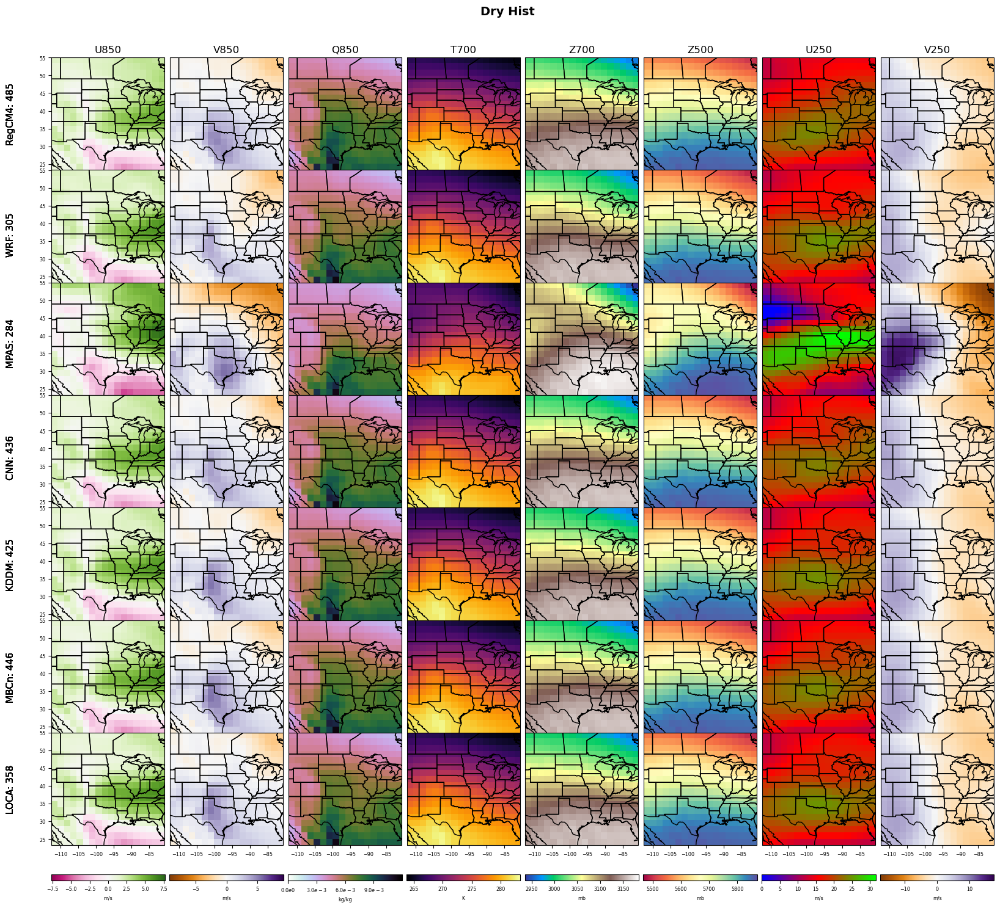

In [95]:
print("DRY HIST")
sigfiles_hist = list(filter(lambda line:'hist' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_hist, vmin, vmax, 0, 0.254, "Dry Hist")


MOIST HIST


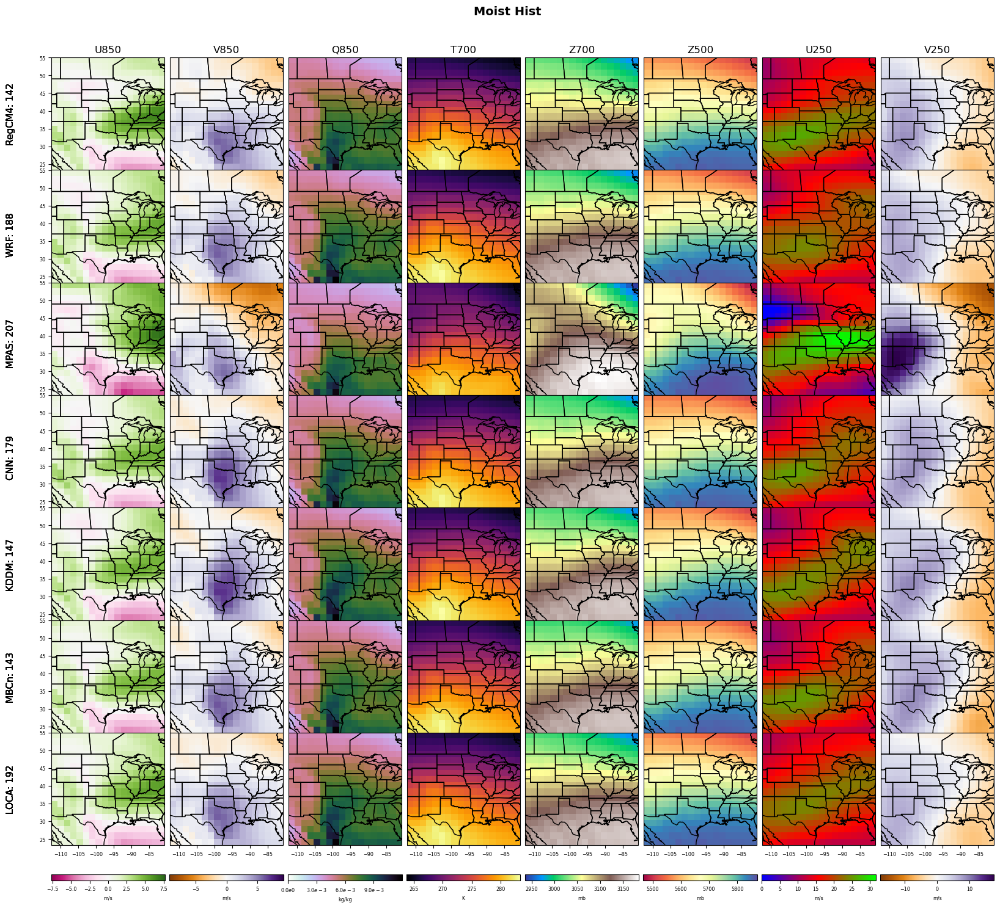

In [96]:
print("MOIST HIST")
sigfiles_hist = list(filter(lambda line:'hist' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_hist, vmin, vmax, 0.254, 3, "Moist Hist")


WET HIST


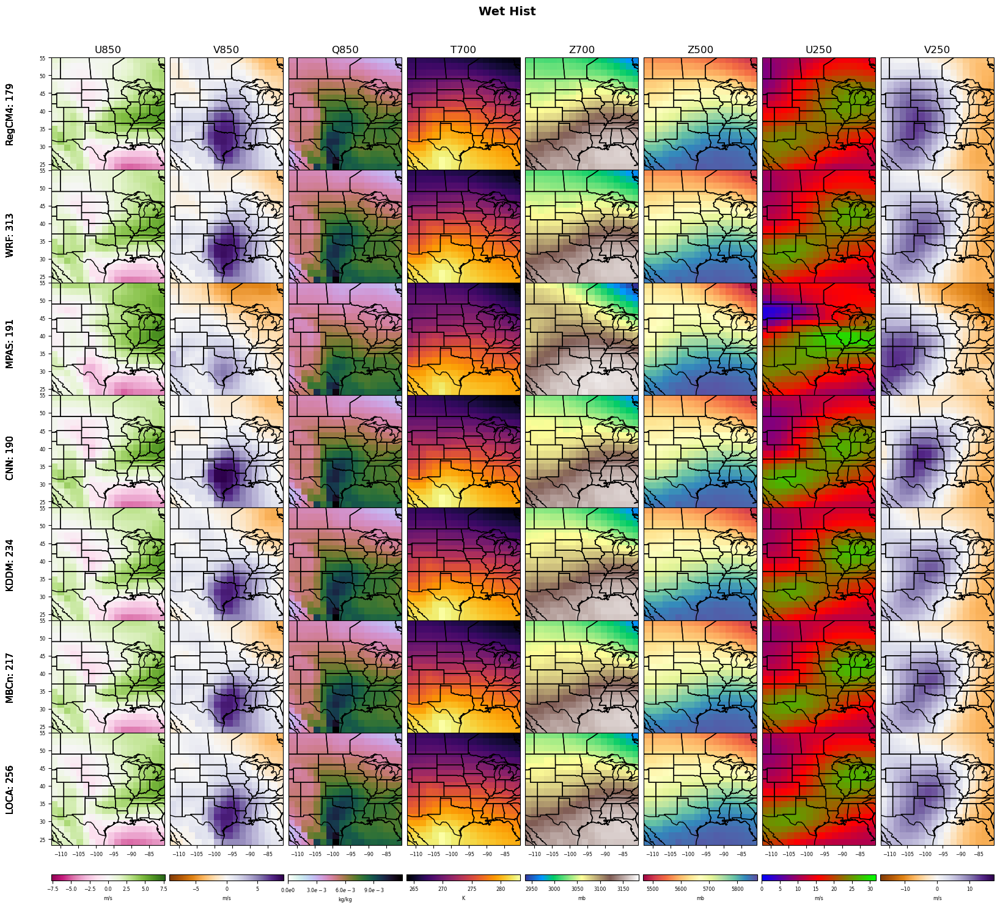

In [97]:
print("WET HIST")
sigfiles_hist = list(filter(lambda line:'hist' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_hist, vmin, vmax, 3., 9999, "Wet Hist")


### RCP85

In [98]:
# find max/min for each variable accross ALL rcp85 files
sigfiles_rcp85 = list(filter(lambda line:'rcp85' in line, mpi_sigfiles))

# find min/max values for entire sigfiles set
vmin = 9999*np.ones(8) 
vmax = -9999*np.ones(8) 
for sigfile in sigfiles_rcp85:        
    if sigfile.lower().find('hist') >= 0: 
        load_uatm_mpi_hist()
    elif sigfile.lower().find('rcp85') >= 0: 
        load_uatm_mpi_future()
    else:
        print ("ERROR: neither hist or rcp85 found")
    rainsignal = xr.open_dataset(sigfile)['prec']
    
    for mpr_min, mpr_max in [(0,0.254), (0.254, 3.0), (3.0, 9999.0)]:
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
        #avginput -= allinput # climate
        vmin = [min(avginput[ii].min(),vmin[ii]) for ii in range(8)]
        vmax = [max(avginput[ii].max(),vmax[ii]) for ii in range(8)]


In [99]:
print(vmin)
print(vmax)

[-5.245575254829369, -3.465457667475161, 0.003264548383603178, 267.02289592685986, 2989.380942863504, 5554.487581623134, 8.374554520133156, -6.585132271902902]
[8.430331610645037, 10.0453096703638, 0.01505463979694815, 288.6095920713608, 3221.7559111973023, 5956.045664911685, 28.817723630079584, 12.610823370330962]


DRY RCP85


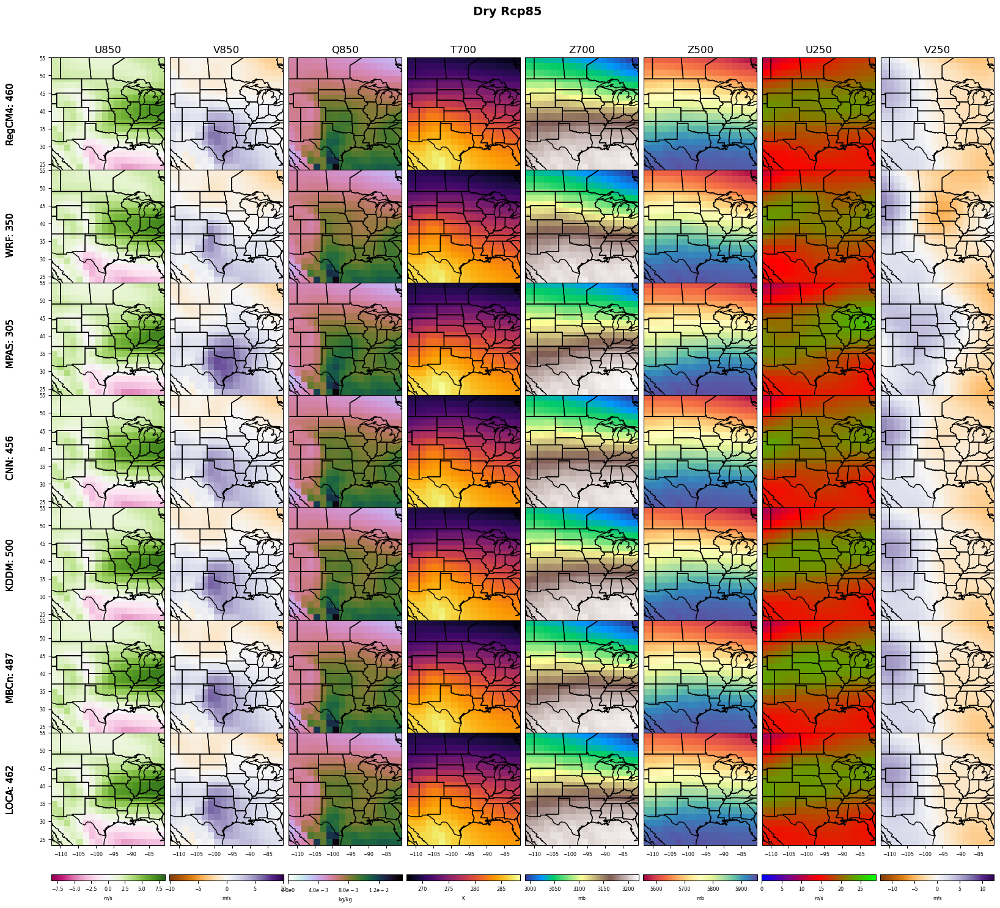

In [100]:
print("DRY RCP85")
sigfiles_rcp85 = list(filter(lambda line:'rcp85' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_rcp85, vmin, vmax, 0, 0.254, "Dry Rcp85")


MOIST RCP85


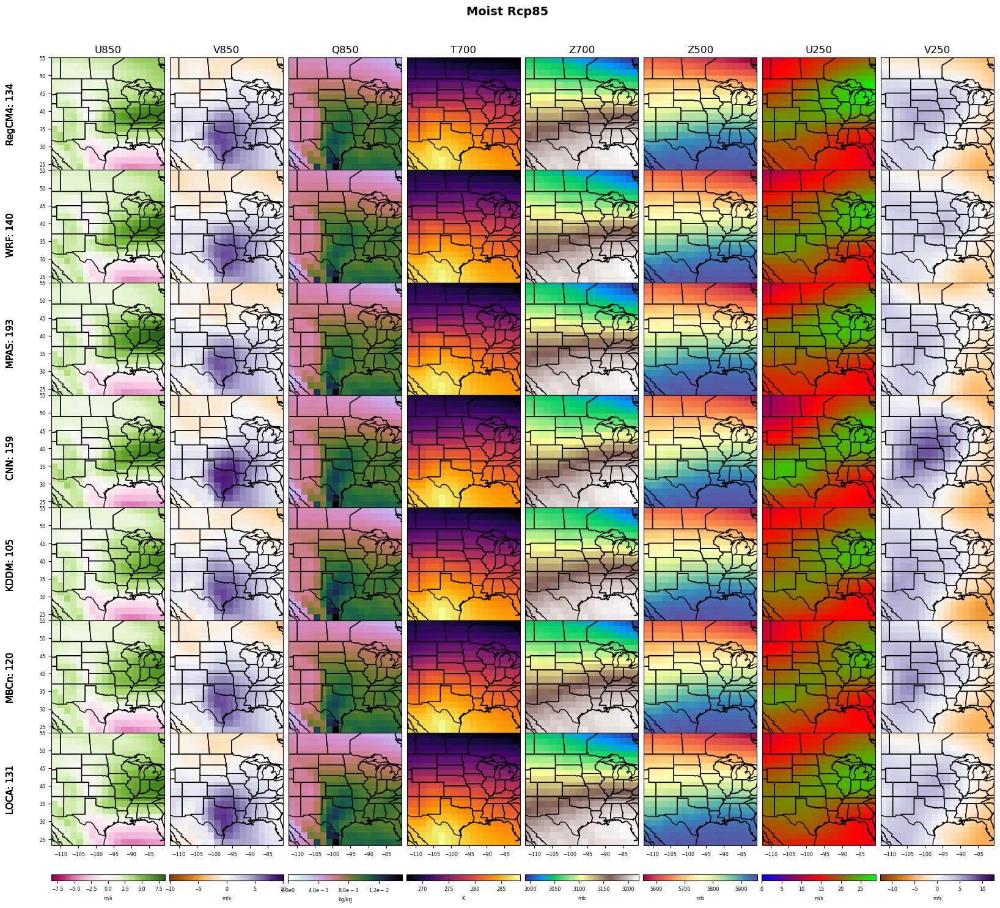

In [101]:
print("MOIST RCP85")
sigfiles_rcp85 = list(filter(lambda line:'rcp85' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_rcp85, vmin, vmax, 0.254, 3, "Moist Rcp85")


WET RCP85


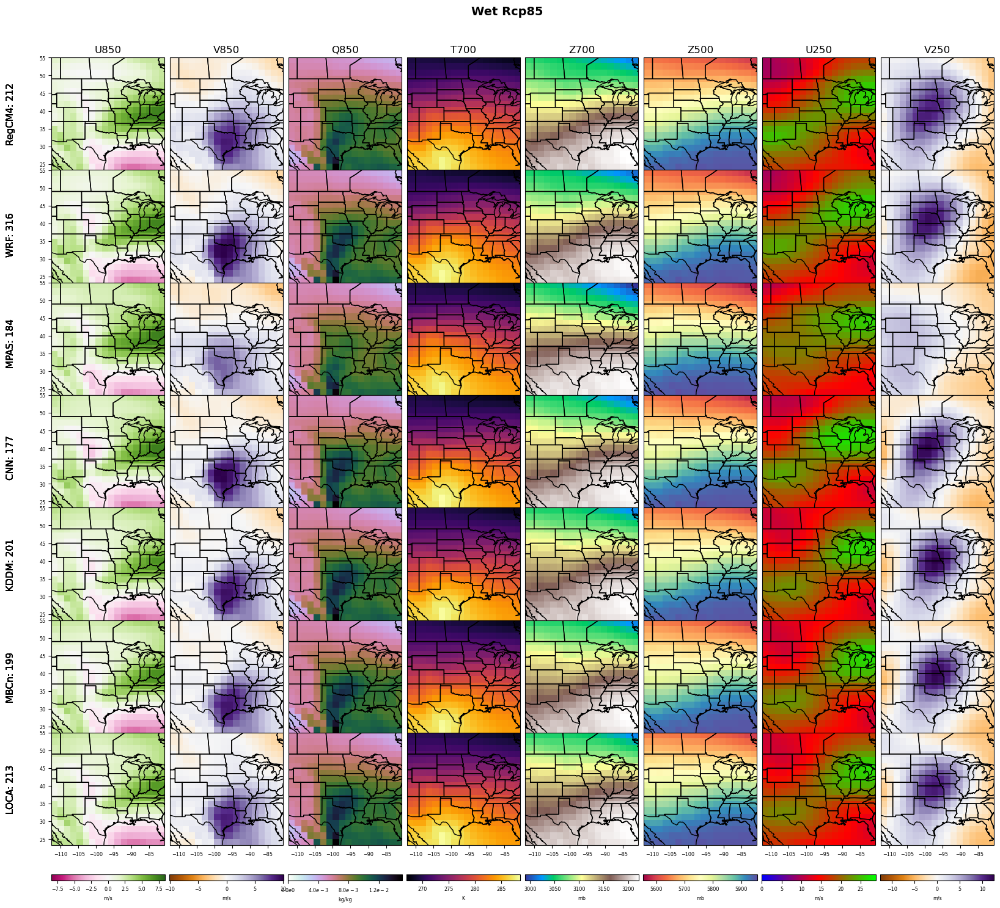

In [102]:
print("WET RCP85")
sigfiles_rcp85 = list(filter(lambda line:'rcp85' in line, mpi_sigfiles))
plot_models_group_drymoistwet(sigfiles_rcp85, vmin, vmax, 3., 9999, "Wet Rcp85")


RCP85


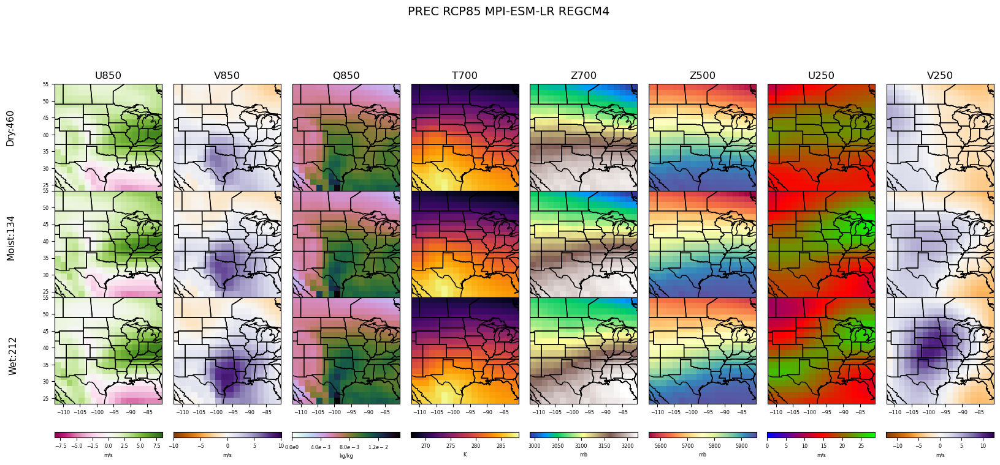

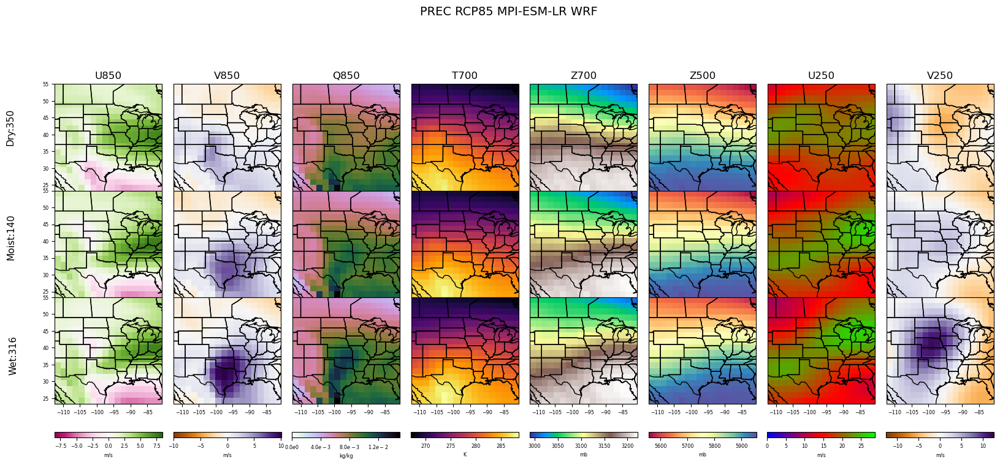

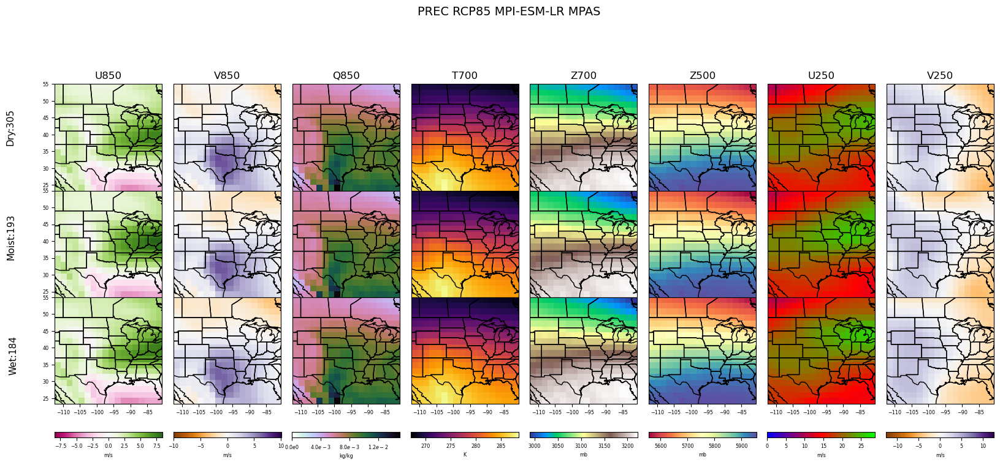

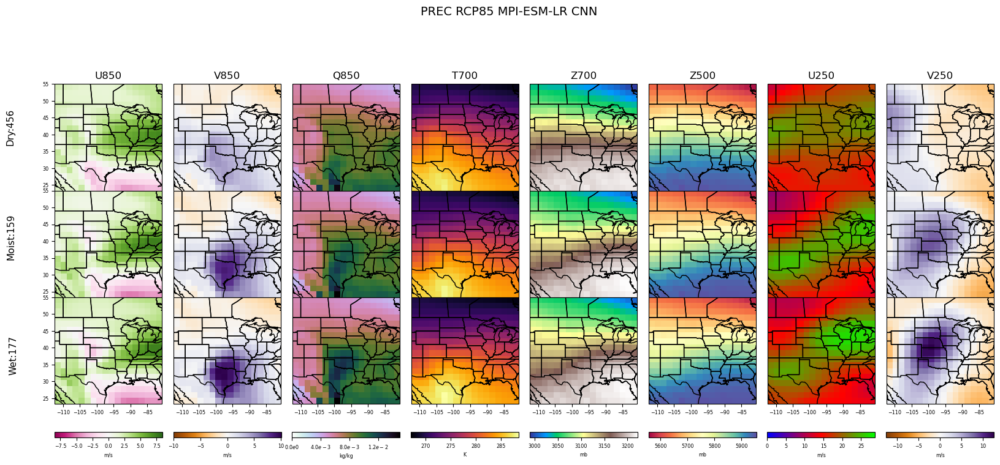

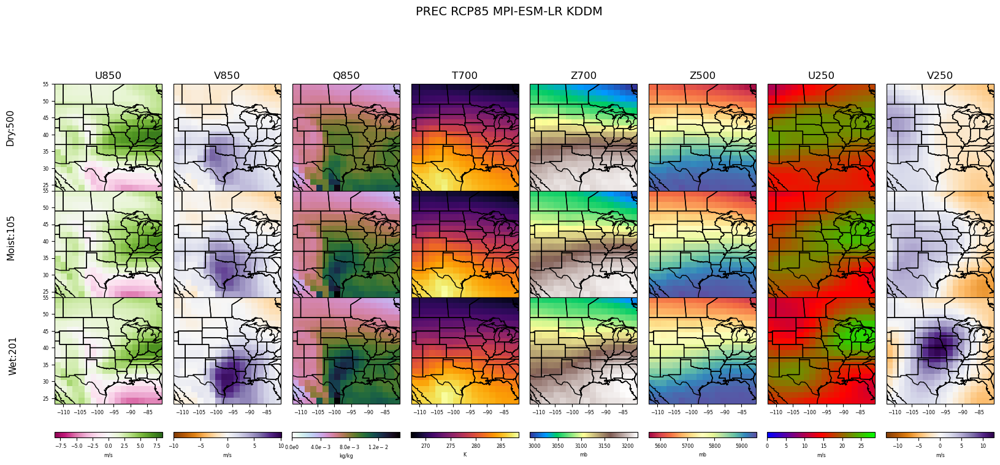

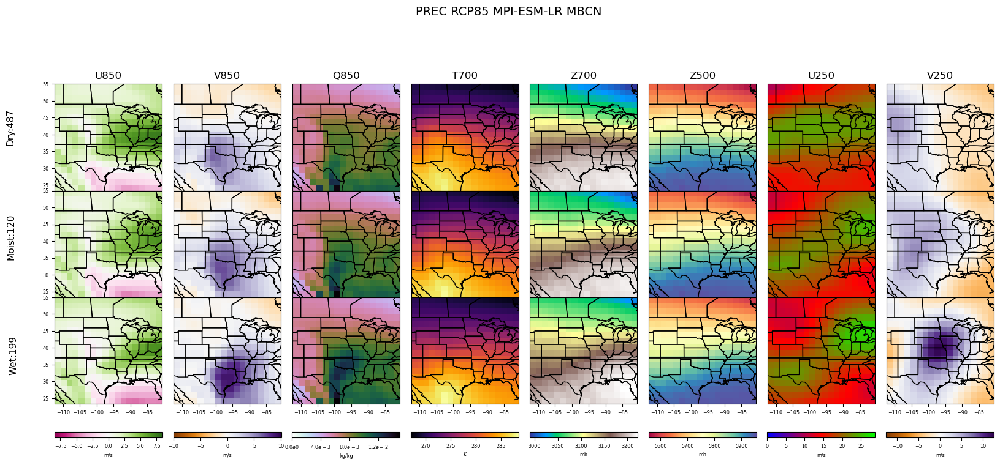

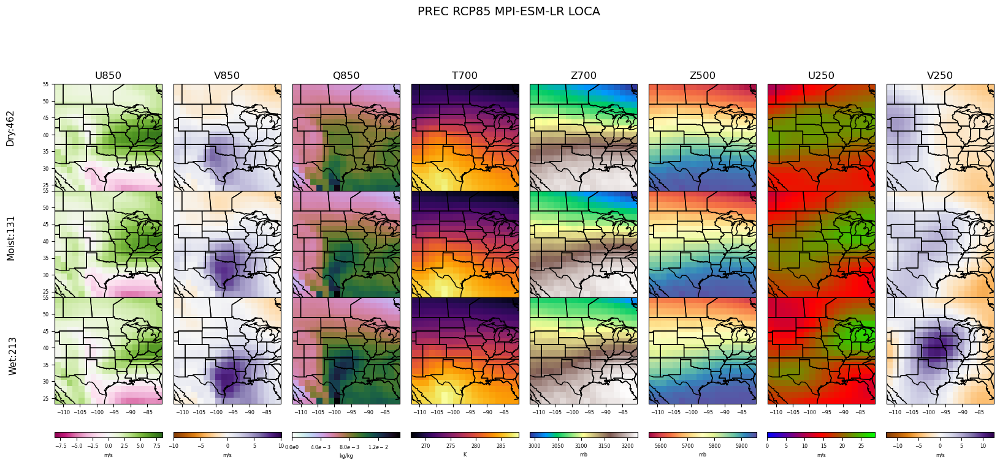

In [189]:
# plot mpi dry/moist/wet: rcp85
print("RCP85")
sigfiles_rcp85 = list(filter(lambda line:'rcp85' in line, mpi_sigfiles))
#plot_models(sigfiles_rcp85, vmin, vmax)
plot_models_group_drymoistwet(sigfiles_rcp85, vmin, vmax)


In [105]:
5

5